# 여기부터 라고 써 있는 부분까지는 node의 내용과 같습니다

In [50]:
#필요한 라이브러리를 로드합니다. 
import os
import math
import numpy as np
import tensorflow as tf
import pandas as pd
import random

from PIL import Image
import matplotlib.pyplot as plt
from skimage.io import imread
from skimage.transform import resize
from glob import glob

# from tensorflow.keras.models import *
# from tensorflow.keras.layers import *
# from tensorflow.keras.optimizers import *
from tensorflow.keras.layers import Input, Conv2D, Conv2DTranspose, MaxPooling2D, concatenate, BatchNormalization, Dropout
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import ModelCheckpoint, CSVLogger
from keras.regularizers import l2

In [2]:
# augmentation 적용 
from albumentations import  HorizontalFlip, RandomSizedCrop, Compose, OneOf, Resize

def build_augmentation(is_train=True):
  if is_train:    # 훈련용 데이터일 경우
    return Compose([
                    HorizontalFlip(p=0.5),    # 50%의 확률로 좌우대칭
                    RandomSizedCrop(         # 50%의 확률로 RandomSizedCrop
                        min_max_height=(300, 370),
                        w2h_ratio=370/1242,
                        height=224,
                        width=224,
                        p=0.5
                        ),
                    Resize(              # 입력이미지를 224X224로 resize
                        width=224,
                        height=224
                        )
                    ])
  return Compose([      # 테스트용 데이터일 경우에는 224X224로 resize만 수행합니다. 
                Resize(
                    width=224,
                    height=224
                    )
                ])

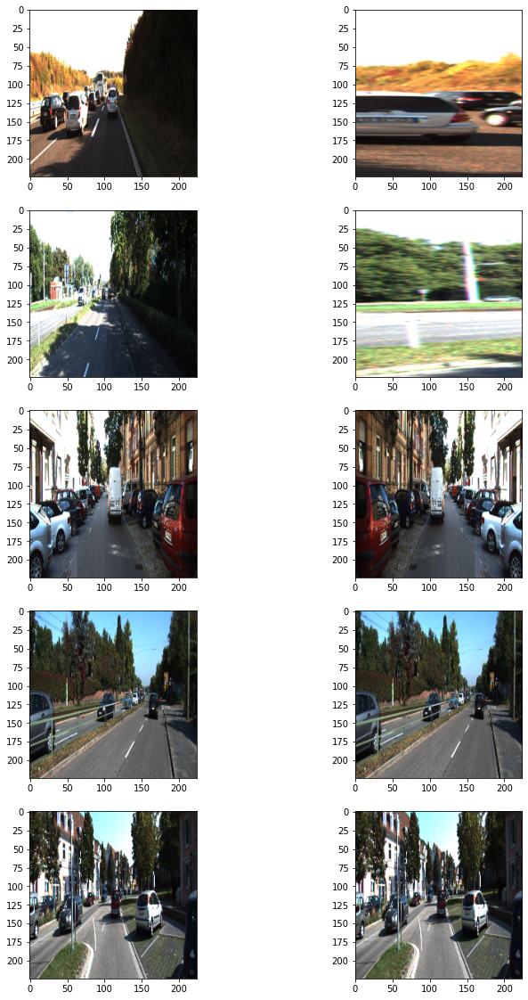

In [3]:
dir_path = os.getenv('HOME')+'/aiffel/semantic_segmentation/data/training'

augmentation_train = build_augmentation()
augmentation_test = build_augmentation(is_train=False)
input_images = glob(os.path.join(dir_path, "image_2", "*.png"))

# 훈련 데이터셋에서 5개만 가져와 augmentation을 적용해 봅시다.  
plt.figure(figsize=(12, 20))
for i in range(5):
    image = imread(input_images[i]) 
    image_data = {"image":image}
    resized = augmentation_test(**image_data)
    processed = augmentation_train(**image_data)
    plt.subplot(5, 2, 2*i+1)
    plt.imshow(resized["image"])  # 왼쪽이 원본이미지
    plt.subplot(5, 2, 2*i+2)
    plt.imshow(processed["image"])  # 오른쪽이 augment된 이미지
  
plt.show()

In [4]:
# tf.keras.utils.Sequence를 상속받은 generator 형태로 데이터셋을 구성
class KittiGenerator(tf.keras.utils.Sequence):
  '''
  KittiGenerator는 tf.keras.utils.Sequence를 상속받습니다.
  우리가 KittiDataset을 원하는 방식으로 preprocess하기 위해서 Sequnce를 커스텀해 사용합니다.
  '''
  def __init__(self, 
               dir_path,
               batch_size=16,
               img_size=(224, 224, 3),
               output_size=(224, 224),
               is_train=True,
               augmentation=None):
    '''
    dir_path: dataset의 directory path입니다.
    batch_size: batch_size입니다.
    img_size: preprocess에 사용할 입력이미지의 크기입니다.
    output_size: ground_truth를 만들어주기 위한 크기입니다.
    is_train: 이 Generator가 학습용인지 테스트용인지 구분합니다.
    augmentation: 적용하길 원하는 augmentation 함수를 인자로 받습니다.
    '''
    self.dir_path = dir_path
    self.batch_size = batch_size
    self.is_train = is_train
    self.dir_path = dir_path
    self.augmentation = augmentation
    self.img_size = img_size
    self.output_size = output_size

    # load_dataset()을 통해서 kitti dataset의 directory path에서 라벨과 이미지를 확인합니다.
    self.data = self.load_dataset()

  def load_dataset(self):
    # kitti dataset에서 필요한 정보(이미지 경로 및 라벨)를 directory에서 확인하고 로드하는 함수입니다.
    # 이때 is_train에 따라 test set을 분리해서 load하도록 해야합니다.
    input_images = glob(os.path.join(self.dir_path, "image_2", "*.png"))
    label_images = glob(os.path.join(self.dir_path, "semantic", "*.png"))
    input_images.sort()
    label_images.sort()
    assert len(input_images) == len(label_images)
    data = [ _ for _ in zip(input_images, label_images)]

    if self.is_train:
      return data[:-30]
    return data[-30:]
    
  def __len__(self):
    # Generator의 length로서 전체 dataset을 batch_size로 나누고 소숫점 첫째자리에서 올림한 값을 반환합니다.
    return math.ceil(len(self.data) / self.batch_size)

  def __getitem__(self, index):
    # 입력과 출력을 만듭니다.
    # 입력은 resize및 augmentation이 적용된 input image이고 
    # 출력은 semantic label입니다.
    batch_data = self.data[
                           index*self.batch_size:
                           (index + 1)*self.batch_size
                           ]
    inputs = np.zeros([self.batch_size, *self.img_size])
    outputs = np.zeros([self.batch_size, *self.output_size])
        
    for i, data in enumerate(batch_data):
      input_img_path, output_path = data
      _input = imread(input_img_path)
      _output = imread(output_path)
      _output = (_output==7).astype(np.uint8)*1
      data = {
          "image": _input,
          "mask": _output,
          }
      augmented = self.augmentation(**data)
      inputs[i] = augmented["image"]/255
      outputs[i] = augmented["mask"]
      return inputs, outputs

  def on_epoch_end(self):
    # 한 epoch가 끝나면 실행되는 함수입니다. 학습중인 경우에 순서를 random shuffle하도록 적용한 것을 볼 수 있습니다.
    self.indexes = np.arange(len(self.data))
    if self.is_train == True :
      np.random.shuffle(self.indexes)
      return self.indexes

In [5]:
augmentation = build_augmentation()
test_preproc = build_augmentation(is_train=False)
        
train_generator = KittiGenerator(
    dir_path, 
    augmentation=augmentation,
)

test_generator = KittiGenerator(
    dir_path, 
    augmentation=test_preproc,
    is_train=False
)

# 여기부터
# u-net 생성
- 논문에서는 conv2D에 padding을 주지 않았지만, 구글링해서 찾은 대부분의 코드들이 padding을 주는 방식으로 작성되어 있음 
- padding을 줘도 문제 없을꺼라 판단, skip connection 구현이 쉬워짐

In [6]:
def EncoderMiniBlock(inputs, n_filters=32, dropout_prob=0.3, max_pooling=True):
    conv = Conv2D(n_filters, 
                  3,  # filter size
                  activation='relu',
                  padding='same',
                  kernel_initializer='HeNormal')(inputs)
    conv = Conv2D(n_filters, 
                  3,  # filter size
                  activation='relu',
                  padding='same',
                  kernel_initializer='HeNormal')(conv)
  
    conv = BatchNormalization()(conv)
    if dropout_prob > 0:     
        conv = tf.keras.layers.Dropout(dropout_prob)(conv)
    if max_pooling:
        next_layer = tf.keras.layers.MaxPooling2D(pool_size = (2,2))(conv)    
    else:
        next_layer = conv
    skip_connection = conv    
    return next_layer, skip_connection

In [7]:
def DecoderMiniBlock(prev_layer_input, skip_layer_input, n_filters=32):
    up = Conv2DTranspose(
                 n_filters,
                 (3,3),
                 strides=(2,2),
                 padding='same')(prev_layer_input)
    merge = concatenate([up, skip_layer_input], axis=3)
    conv = Conv2D(n_filters, 
                 3,  
                 activation='relu',
                 padding='same',
                 kernel_initializer='HeNormal')(merge)
    conv = Conv2D(n_filters,
                 3, 
                 activation='relu',
                 padding='same',
                 kernel_initializer='HeNormal')(conv)
    return conv

In [8]:
# u-net 모델 구조 생성 
def build_model(input_shape=(224, 224, 3)):
    model = None
    
    input_layer = Input(shape=input_shape)
    
    output_layer, conv_01 = EncoderMiniBlock(input_layer, n_filters=64, dropout_prob=0.3, max_pooling=True)
    output_layer, conv_02 = EncoderMiniBlock(output_layer, n_filters=128, dropout_prob=0.3, max_pooling=True)
    output_layer, conv_03 = EncoderMiniBlock(output_layer, n_filters=256, dropout_prob=0.3, max_pooling=True)
    output_layer, conv_04 = EncoderMiniBlock(output_layer, n_filters=512, dropout_prob=0.3, max_pooling=True)
    output_layer, _ = EncoderMiniBlock(output_layer, n_filters=1024, dropout_prob=0.3, max_pooling=False)
    
    output_layer = DecoderMiniBlock(output_layer, conv_04, n_filters=512)
    output_layer = DecoderMiniBlock(output_layer, conv_03, n_filters=256)
    output_layer = DecoderMiniBlock(output_layer, conv_02, n_filters=128)
    output_layer = DecoderMiniBlock(output_layer, conv_01, n_filters=64)
    
    output = Conv2D(1, 1, activation='sigmoid')(output_layer)
    
    model = Model(inputs=input_layer, outputs=output)
    return model

# 모델 학습
- 매 epoch마다 가중치를 저장하게 함 (5 epoch마다 저장하게 하려 했으나 실패, 라이브러리 버전 이슈인듯)
- val_loss 기준 best 모델 저장
- loss, val_loss 저장

In [9]:
checkpoint_path = os.getenv('HOME')+'/aiffel/semantic_segmentation/modelCheckpoints/epoch_{epoch:02d}.h5'
best_model_path = os.getenv('HOME')+'/aiffel/semantic_segmentation/model/best_model.h5'
log_path = os.getenv('HOME')+'/aiffel/semantic_segmentation/model/training_log.csv'

In [10]:
model = build_model()
model.compile(optimizer = Adam(1e-4), loss = 'binary_crossentropy')

checkpoint_callback = ModelCheckpoint(
    filepath=checkpoint_path,
    save_weights_only=True,
    save_freq="epoch"
#     save_freq = 5 * len(train_generator)
)

best_model_callback = ModelCheckpoint(
    filepath=best_model_path,
    save_weights_only=True,
    monitor='val_loss',
    mode='min',
    save_best_only=True
)

csv_logger = CSVLogger(log_path, append=False)

model.fit(
     train_generator,
     validation_data=test_generator,
     steps_per_epoch=len(train_generator),
     validation_steps=len(test_generator),
     epochs=100,
     callbacks=[checkpoint_callback, best_model_callback, csv_logger]
)

Epoch 1/100
11/11 [==============================] - 26s 830ms/step - loss: 0.5761 - val_loss: 0.2813
Epoch 2/100
11/11 [==============================] - 9s 779ms/step - loss: 0.0416 - val_loss: 0.0605
Epoch 3/100
11/11 [==============================] - 8s 768ms/step - loss: 0.0405 - val_loss: 0.1478
Epoch 4/100
11/11 [==============================] - 8s 764ms/step - loss: 0.0382 - val_loss: 0.1621
Epoch 5/100
11/11 [==============================] - 8s 762ms/step - loss: 0.0375 - val_loss: 0.1874
Epoch 6/100
11/11 [==============================] - 8s 762ms/step - loss: 0.0275 - val_loss: 0.2132
Epoch 7/100
11/11 [==============================] - 8s 759ms/step - loss: 0.0334 - val_loss: 0.2394
Epoch 8/100
11/11 [==============================] - 8s 758ms/step - loss: 0.0305 - val_loss: 0.2689
Epoch 9/100
11/11 [==============================] - 8s 757ms/step - loss: 0.0264 - val_loss: 0.2865
Epoch 10/100
11/11 [==============================] - 8s 756ms/step - loss: 0.0252 - val_l

11/11 [==============================] - 8s 760ms/step - loss: 0.0075 - val_loss: 0.0608
Epoch 82/100
11/11 [==============================] - 8s 764ms/step - loss: 0.0105 - val_loss: 0.0745
Epoch 83/100
11/11 [==============================] - 8s 763ms/step - loss: 0.0113 - val_loss: 0.0549
Epoch 84/100
11/11 [==============================] - 8s 762ms/step - loss: 0.0076 - val_loss: 0.0234
Epoch 85/100
11/11 [==============================] - 8s 763ms/step - loss: 0.0062 - val_loss: 0.0139
Epoch 86/100
11/11 [==============================] - 8s 761ms/step - loss: 0.0107 - val_loss: 0.0305
Epoch 87/100
11/11 [==============================] - 8s 761ms/step - loss: 0.0086 - val_loss: 0.0240
Epoch 88/100
11/11 [==============================] - 8s 762ms/step - loss: 0.0062 - val_loss: 0.0127
Epoch 89/100
11/11 [==============================] - 8s 762ms/step - loss: 0.0127 - val_loss: 0.0159
Epoch 90/100
11/11 [==============================] - 8s 760ms/step - loss: 0.0094 - val_loss: 

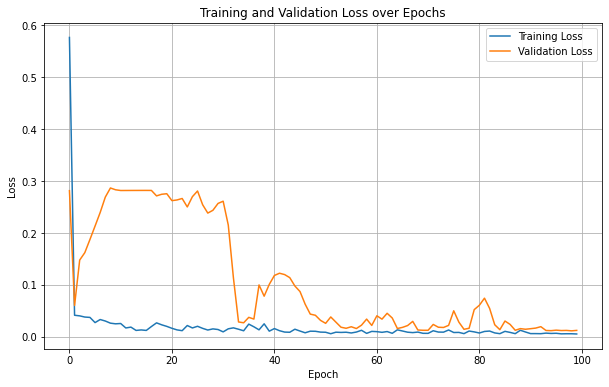

In [22]:
training_log = pd.read_csv(log_path)

# loss와 val_loss를 시각화합니다.
plt.figure(figsize=(10, 6))
plt.plot(training_log['epoch'], training_log['loss'], label='Training Loss')
plt.plot(training_log['epoch'], training_log['val_loss'], label='Validation Loss')

plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training and Validation Loss over Epochs')
plt.legend()
plt.grid(True)
plt.show()

# 결과해석
- val_loss가 변동성이 큰 모습을 보이나, 뒤로 갈 수록 진폭이 작아지고는 있음 -> 정상 학습인지는 모르겠음
- Loss 범위를 줄여서 확인 필요

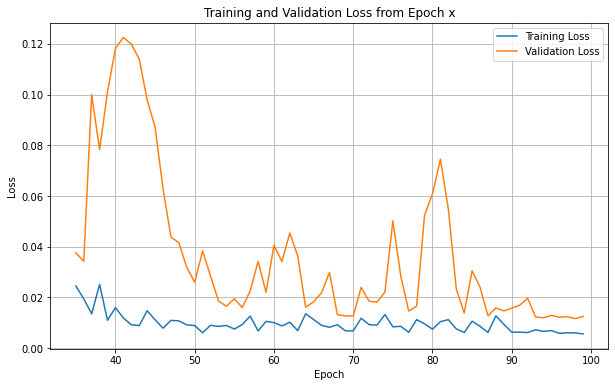

In [23]:
# 특정 epoch 부터 데이터만 선택합니다.
training_log_after = training_log[training_log['epoch'] >= 35]

# loss와 val_loss를 시각화합니다.
plt.figure(figsize=(10, 6))
plt.plot(training_log_after['epoch'], training_log_after['loss'], label='Training Loss')
plt.plot(training_log_after['epoch'], training_log_after['val_loss'], label='Validation Loss')

plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training and Validation Loss from Epoch x')
plt.legend()
plt.grid(True)
plt.show()

# 결과해석
- epoch 35부터 짤라 본 결과
- train loss는 더 줄어들지 않고 수렴함
- val loss도 조금씩 줄어드는 것처럼 보임
- epoch 100으로는 과적합이 진행되지 않은 것으로 보이지만, 일반적으로 볼 수 있는 차트는 아니여서 좀 더 공부해봐야 할 듯
    - 학습 데이터가 200개 밖에 안 되서 그런가?

In [10]:
def calculate_iou_score(target, prediction):
    intersection = np.logical_and(target, prediction)
    union = np.logical_or(target, prediction)
    iou_score = np.sum(intersection) / np.sum(union)
#     print('IoU : %f' % iou_score )
    return iou_score

In [11]:
# def get_output(model, preproc, image_path, output_path, label_path, threshold, show=False):
#     origin_img = imread(image_path)
#     data = {"image":origin_img}
#     processed = preproc(**data)
#     output = model(np.expand_dims(processed["image"]/255,axis=0))
#     output = (output[0].numpy()>=threshold).astype(np.uint8).squeeze(-1)*255  #0.5라는 threshold를 변경하면 도로인식 결과범위가 달라집니다.
#     prediction = output/255   # 도로로 판단한 영역
    
#     output = Image.fromarray(output)
#     background = Image.fromarray(origin_img).convert('RGBA')
#     output = output.resize((origin_img.shape[1], origin_img.shape[0])).convert('RGBA')
#     output = Image.blend(background, output, alpha=0.6)
#     if show : 
#         output.show()   # 도로로 판단한 영역을 시각화!
     
#     if label_path:   
#         label_img = imread(label_path)
#         label_data = {"image":label_img}
#         label_processed = preproc(**label_data)
#         label_processed = label_processed["image"]
#         target = (label_processed == 7).astype(np.uint8)*1   # 라벨에서 도로로 기재된 영역

#         return output, prediction, target
#     else:
#         return output, prediction, _

In [26]:
def get_output(model, preproc, image_path, output_path, label_path, threshold, show=False):
    origin_img = imread(image_path)
    data = {"image":origin_img}
    processed = preproc(**data)
    output = model(np.expand_dims(processed["image"]/255,axis=0))
    output = (output[0].numpy()>=threshold).astype(np.uint8).squeeze(-1)*255  #0.5라는 threshold를 변경하면 도로인식 결과범위가 달라집니다.
    prediction = output/255   # 도로로 판단한 영역
    
    output = Image.fromarray(output)
    background = Image.fromarray(origin_img).convert('RGBA')
    output = output.resize((origin_img.shape[1], origin_img.shape[0])).convert('RGBA')
    output = Image.blend(background, output, alpha=0.6)
    if show : 
        output.show()   # 도로로 판단한 영역을 시각화!
     
    if label_path:   
        label_img = imread(label_path)
        label_data = {"image":label_img}
        label_processed = preproc(**label_data)
        label_processed = label_processed["image"]
        target = (label_processed == 7).astype(np.uint8)*1   # 라벨에서 도로로 기재된 영역

        return origin_img, output, prediction, target
    else:
        return origin_img, output, prediction, _

In [16]:
# 가중치 파일이 저장된 디렉토리
checkpoint_dir = os.getenv('HOME')+'/aiffel/semantic_segmentation/modelCheckpoints/'
# 테스트 데이터셋 경로
test_images_dir = dir_path + f'/image_2/'
test_labels_dir = dir_path + f'/semantic/'
test_outputs_dir = os.getenv('HOME')+'/aiffel/semantic_segmentation/results/'

# 
model = build_model()
model.compile(optimizer = Adam(1e-4), loss = 'binary_crossentropy')

# 모든 epoch의 IoU 점수를 저장할 리스트
iou_scores = []

# 모든 체크포인트 파일을 가져옵니다.
checkpoint_files = sorted([f for f in os.listdir(checkpoint_dir) if f.endswith('.h5')])
# print(checkpoint_files)

Epoch 10: Mean IoU = 2.5987292052389986e-05
Epoch 20: Mean IoU = 0.0003772276850247932
Epoch 30: Mean IoU = 0.0024911727290619938
Epoch 40: Mean IoU = 0.4394527578780904
Epoch 50: Mean IoU = 0.671463613436558
Epoch 60: Mean IoU = 0.5312943128027748
Epoch 70: Mean IoU = 0.7393505929269262
Epoch 80: Mean IoU = 0.6293479930886474
Epoch 90: Mean IoU = 0.7197373724736112
Epoch 100: Mean IoU = 0.7522511565420329


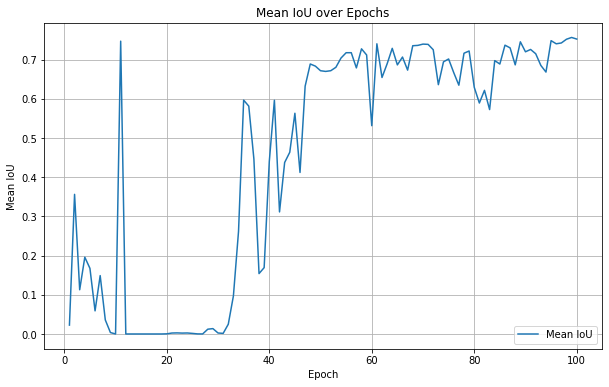

In [17]:
# 테스트 데이터셋의 모든 이미지에 대해 IoU 계산
for epoch, checkpoint_file in enumerate(checkpoint_files):
    model.load_weights(os.path.join(checkpoint_dir, checkpoint_file))
    
    total_iou = 0
    num_samples = 0
    
    for image_name in os.listdir(test_images_dir):
        image_path = os.path.join(test_images_dir, image_name)
        label_path = os.path.join(test_labels_dir, image_name)
        output_path = os.path.join(test_outputs_dir, image_name)
        
#         prediction, target = get_output(model, test_preproc, image_path, label_path, threshold=0.5)
#         output, prediction, target = get_output(
#                                                  model, 
#                                                  test_preproc,
#                                                  image_path=image_path,
#                                                  output_path=output_path,
#                                                  label_path=label_path,
#                                                  threshold = 0.5
#                                              )
        origin_img, output, prediction, target = get_output(
                                                             model, 
                                                             test_preproc,
                                                             image_path=image_path,
                                                             output_path=output_path,
                                                             label_path=label_path,
                                                             threshold = 0.5
                                                         )
        if target is not None:
            iou_score = calculate_iou_score(target, prediction)
            total_iou += iou_score
            num_samples += 1
    
    mean_iou = total_iou / num_samples if num_samples > 0 else 0
    iou_scores.append(mean_iou)

    if (epoch + 1) % 10 == 0:
        print(f'Epoch {epoch + 1}: Mean IoU = {mean_iou}')

# IoU 점수를 시각화합니다.
plt.figure(figsize=(10, 6))
plt.plot(range(1, len(iou_scores) + 1), iou_scores, label='Mean IoU')
plt.xlabel('Epoch')
plt.ylabel('Mean IoU')
plt.title('Mean IoU over Epochs')
plt.legend()
plt.grid(True)
plt.show()

# 결과 해석
- val loss와 train 이미지의 iou가 서로 반대되는 그래프 모양이 나오고 있음
    - 어찌보면 너무 당연한 결과..

In [18]:
# IoU 점수를 CSV 파일로 저장합니다.
iou_df = pd.DataFrame({
    'epoch': range(1, len(iou_scores) + 1),
    'mean_iou': iou_scores
})

mean_iou_path = os.getenv('HOME')+'/aiffel/semantic_segmentation/model/mean_iou.csv'

iou_df.to_csv(mean_iou_path, index=False)

# 베스트 모델을 적용한 결과물 비교

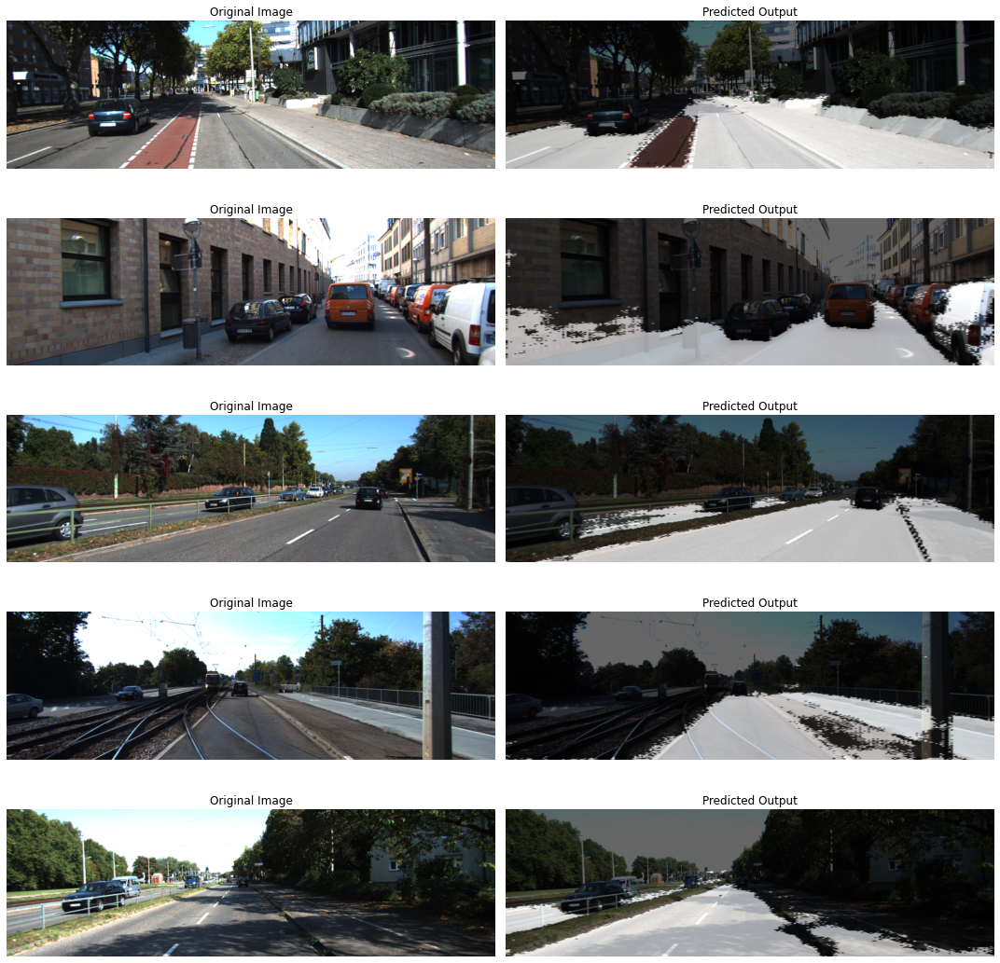

In [39]:
# 베스트 모델을 적용한 결과물 비교 
model.load_weights(best_model_path)

# 테스트 이미지 디렉토리에서 랜덤하게 5개 이미지 선택
test_image_files = os.listdir(test_images_dir)
random_images = random.sample(test_image_files, 5)

# 랜덤하게 선택한 5개 이미지에 대해 원본과 예측 결과를 시각화
fig, axes = plt.subplots(5, 2, figsize=(15, 15))

for i, image_name in enumerate(random_images):
    image_path = os.path.join(test_images_dir, image_name)
    label_path = os.path.join(test_labels_dir, image_name)
    output_path = os.path.join(test_outputs_dir, image_name)
    
    origin_img, output, prediction, target = get_output(
                                                     model, 
                                                     test_preproc,
                                                     image_path=image_path,
                                                     output_path=output_path,
                                                     label_path=label_path,
                                                     threshold = 0.5
                                                 )
    
    axes[i, 0].imshow(origin_img)
    axes[i, 0].set_title('Original Image')
    axes[i, 0].axis('off')
    
    axes[i, 1].imshow(output, cmap='gray')
    axes[i, 1].set_title('Predicted Output')
    axes[i, 1].axis('off')

plt.tight_layout()
plt.show()

# 결과해석
- 차도와 인도를 잘 구분하지 못하고 있음
- 가끔 벽까지 영역이 확장되는 것을 볼때, 반질반질한 질감을 학습한 것으로 보임

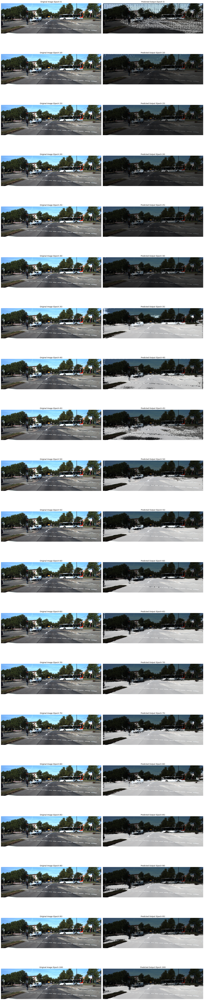

In [29]:
# 테스트 이미지 디렉토리에서 랜덤하게 1개 이미지 선택
test_image_files = os.listdir(test_images_dir)
random_image = random.choice(test_image_files)

# 랜덤하게 선택한 이미지에 대해 원본과 예측 결과를 시각화
# fig, axes = plt.subplots(5, 2, figsize=(10, 25))
fig, axes = plt.subplots(20, 2, figsize=(20, 100))

for i, epoch in enumerate(range(5, 101, 5)):
    checkpoint_file = f'epoch_{epoch:02d}.h5'
    checkpoint_path = os.path.join(checkpoint_dir, checkpoint_file)
    
    # 가중치 파일 로드
    model.load_weights(checkpoint_path)
    
    image_path = os.path.join(test_images_dir, random_image)
    label_path = os.path.join(test_labels_dir, random_image)
    output_path = os.path.join(test_outputs_dir, image_name)
    
    origin_img, output, prediction, target = get_output(
                                                     model, 
                                                     test_preproc,
                                                     image_path=image_path,
                                                     output_path=output_path,
                                                     label_path=label_path,
                                                     threshold = 0.5
                                                 )
    
    axes[i, 0].imshow(origin_img)
    axes[i, 0].set_title(f'Original Image (Epoch {epoch})')
    axes[i, 0].axis('off')
    
    axes[i, 1].imshow(output, cmap='gray')
    axes[i, 1].set_title(f'Predicted Output (Epoch {epoch})')
    axes[i, 1].axis('off')

plt.tight_layout()
plt.show()

# 결과해석
- epoch 30까지는 잘 못찾아내다가, 35부터 길을 학습함 - 이때는 사물들도 길로 인식
- 35부터는 사물을 길로 잘 못 인식한 영역을 줄이는 학습이 진행되는 것이 보임 

# UNET++ 구현
- Nested UNet" 또는 "Nested U-Net"으로 더 많이 불리는 듯

In [51]:
def dice_coef(y_true, y_pred):
    smooth = 1.
    y_true_f = K.flatten(y_true)
    y_pred_f = K.flatten(y_pred)
    intersection = K.sum(y_true_f * y_pred_f)
    return (2. * intersection + smooth) / (K.sum(y_true_f) + K.sum(y_pred_f) + smooth)

def standard_unit(input_tensor, stage, nb_filter, kernel_size=3):
    act = 'elu'
    x = Conv2D(nb_filter, (kernel_size, kernel_size), activation=act, name='conv'+stage+'_1', padding='same', kernel_initializer='he_normal')(input_tensor)
    x = Dropout(0.5, name='dp'+stage+'_1')(x)
    x = Conv2D(nb_filter, (kernel_size, kernel_size), activation=act, name='conv'+stage+'_2', padding='same', kernel_initializer='he_normal')(x)
    x = BatchNormalization(axis=bn_axis, name='bn'+stage+'_2')(x)
    return x

In [48]:
from keras import backend as K

def Nest_Net(img_rows, img_cols, color_type=1, num_class=1, deep_supervision=False):

    nb_filter = [32,64,128,256,512]
    act = 'elu'

    # Handle Dimension Ordering for different backends
    global bn_axis
    if K.image_dim_ordering() == 'tf':
      bn_axis = 3
      img_input = Input(shape=(img_rows, img_cols, color_type), name='main_input')
    else:
      bn_axis = 1
      img_input = Input(shape=(color_type, img_rows, img_cols), name='main_input')

    conv1_1 = standard_unit(img_input, stage='11', nb_filter=nb_filter[0])
    pool1 = MaxPooling2D((2, 2), strides=(2, 2), name='pool1')(conv1_1)

    conv2_1 = standard_unit(pool1, stage='21', nb_filter=nb_filter[1])
    pool2 = MaxPooling2D((2, 2), strides=(2, 2), name='pool2')(conv2_1)

    up1_2 = Conv2DTranspose(nb_filter[0], (2, 2), strides=(2, 2), name='up12', padding='same')(conv2_1)
    conv1_2 = concatenate([up1_2, conv1_1], name='merge12', axis=bn_axis)
    conv1_2 = standard_unit(conv1_2, stage='12', nb_filter=nb_filter[0])

    conv3_1 = standard_unit(pool2, stage='31', nb_filter=nb_filter[2])
    pool3 = MaxPooling2D((2, 2), strides=(2, 2), name='pool3')(conv3_1)

    up2_2 = Conv2DTranspose(nb_filter[1], (2, 2), strides=(2, 2), name='up22', padding='same')(conv3_1)
    conv2_2 = concatenate([up2_2, conv2_1], name='merge22', axis=bn_axis)
    conv2_2 = standard_unit(conv2_2, stage='22', nb_filter=nb_filter[1])

    up1_3 = Conv2DTranspose(nb_filter[0], (2, 2), strides=(2, 2), name='up13', padding='same')(conv2_2)
    conv1_3 = concatenate([up1_3, conv1_1, conv1_2], name='merge13', axis=bn_axis)
    conv1_3 = standard_unit(conv1_3, stage='13', nb_filter=nb_filter[0])

    conv4_1 = standard_unit(pool3, stage='41', nb_filter=nb_filter[3])
    pool4 = MaxPooling2D((2, 2), strides=(2, 2), name='pool4')(conv4_1)

    up3_2 = Conv2DTranspose(nb_filter[2], (2, 2), strides=(2, 2), name='up32', padding='same')(conv4_1)
    conv3_2 = concatenate([up3_2, conv3_1], name='merge32', axis=bn_axis)
    conv3_2 = standard_unit(conv3_2, stage='32', nb_filter=nb_filter[2])

    up2_3 = Conv2DTranspose(nb_filter[1], (2, 2), strides=(2, 2), name='up23', padding='same')(conv3_2)
    conv2_3 = concatenate([up2_3, conv2_1, conv2_2], name='merge23', axis=bn_axis)
    conv2_3 = standard_unit(conv2_3, stage='23', nb_filter=nb_filter[1])

    up1_4 = Conv2DTranspose(nb_filter[0], (2, 2), strides=(2, 2), name='up14', padding='same')(conv2_3)
    conv1_4 = concatenate([up1_4, conv1_1, conv1_2, conv1_3], name='merge14', axis=bn_axis)
    conv1_4 = standard_unit(conv1_4, stage='14', nb_filter=nb_filter[0])

    conv5_1 = standard_unit(pool4, stage='51', nb_filter=nb_filter[4])

    up4_2 = Conv2DTranspose(nb_filter[3], (2, 2), strides=(2, 2), name='up42', padding='same')(conv5_1)
    conv4_2 = concatenate([up4_2, conv4_1], name='merge42', axis=bn_axis)
    conv4_2 = standard_unit(conv4_2, stage='42', nb_filter=nb_filter[3])

    up3_3 = Conv2DTranspose(nb_filter[2], (2, 2), strides=(2, 2), name='up33', padding='same')(conv4_2)
    conv3_3 = concatenate([up3_3, conv3_1, conv3_2], name='merge33', axis=bn_axis)
    conv3_3 = standard_unit(conv3_3, stage='33', nb_filter=nb_filter[2])

    up2_4 = Conv2DTranspose(nb_filter[1], (2, 2), strides=(2, 2), name='up24', padding='same')(conv3_3)
    conv2_4 = concatenate([up2_4, conv2_1, conv2_2, conv2_3], name='merge24', axis=bn_axis)
    conv2_4 = standard_unit(conv2_4, stage='24', nb_filter=nb_filter[1])

    up1_5 = Conv2DTranspose(nb_filter[0], (2, 2), strides=(2, 2), name='up15', padding='same')(conv2_4)
    conv1_5 = concatenate([up1_5, conv1_1, conv1_2, conv1_3, conv1_4], name='merge15', axis=bn_axis)
    conv1_5 = standard_unit(conv1_5, stage='15', nb_filter=nb_filter[0])

    nestnet_output_1 = Conv2D(num_class, (1, 1), activation='sigmoid', name='output_1', kernel_initializer = 'he_normal', padding='same', kernel_regularizer=l2(1e-4))(conv1_2)
    nestnet_output_2 = Conv2D(num_class, (1, 1), activation='sigmoid', name='output_2', kernel_initializer = 'he_normal', padding='same', kernel_regularizer=l2(1e-4))(conv1_3)
    nestnet_output_3 = Conv2D(num_class, (1, 1), activation='sigmoid', name='output_3', kernel_initializer = 'he_normal', padding='same', kernel_regularizer=l2(1e-4))(conv1_4)
    nestnet_output_4 = Conv2D(num_class, (1, 1), activation='sigmoid', name='output_4', kernel_initializer = 'he_normal', padding='same', kernel_regularizer=l2(1e-4))(conv1_5)

    if deep_supervision:
        model = Model(input=img_input, output=[nestnet_output_1,
                                               nestnet_output_2,
                                               nestnet_output_3,
                                               nestnet_output_4])
    else:
        model = Model(input=img_input, output=[nestnet_output_4])

    return model

In [49]:
checkpoint_path = os.getenv('HOME')+'/aiffel/semantic_segmentation/plus_modelCheckpoints/epoch_{epoch:02d}.h5'
best_model_path = os.getenv('HOME')+'/aiffel/semantic_segmentation/plus_model/best_model.h5'
log_path = os.getenv('HOME')+'/aiffel/semantic_segmentation/plus_model/training_log.csv'

model = Nest_Net()
model.compile(optimizer = Adam(1e-4), loss = 'binary_crossentropy')

checkpoint_callback = ModelCheckpoint(
    filepath=checkpoint_path,
    save_weights_only=True,
    save_freq="epoch"
)

best_model_callback = ModelCheckpoint(
    filepath=best_model_path,
    save_weights_only=True,
    monitor='val_loss',
    mode='min',
    save_best_only=True
)

csv_logger = CSVLogger(log_path, append=False)

model.fit(
     train_generator,
     validation_data=test_generator,
     steps_per_epoch=len(train_generator),
     validation_steps=len(test_generator),
     epochs=1,
     callbacks=[checkpoint_callback, best_model_callback, csv_logger]
)

TypeError: Nest_Net() missing 2 required positional arguments: 'img_rows' and 'img_cols'